In [42]:
import sys
from os import system
import os
import pandas as pd
import numpy as np
import time
import copy
import pickle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import lr_scheduler
from sklearn.metrics import accuracy_score
from sklearn.externals.joblib import dump, load
from scipy.stats.stats import pearsonr  

In [43]:
data1 = pd.read_csv('classifier_files/data_1.csv')
data2 = pd.read_csv('classifier_files/data_2.csv')
data3 = pd.read_csv('classifier_files/data_3.csv')
data4 = pd.read_csv('classifier_files/data_4.csv')

frames = [data2, data3, data4]
data = pd.concat(frames)
print "Total length of data: ", data.shape
data[0:10]

Total length of data:  (143419, 26)


,true_init_x,true_init_y,true_init_z,noise_coeff,var_sum,diff_x,diff_y,diff_z,v_x,v_y,...,psi_dot,r_var,phi_var,theta_var,psi_var,Tf,MP_Method,Cost,Status,curr_idx
0,0.030606,30.070659,-2.208982,0.0,0.135696,-0.094201,-9.554542,-0.650325,0.000000,0.000000,...,0.000000,0.054077,0.001363,0.018819,0.061437,6.803979,min_vel,32.686506,SUCCESS,11
1,0.022996,29.977758,-2.215450,0.0,0.090304,-3.077670,-8.447705,-4.381620,-0.031632,-1.121211,...,-0.013346,0.000000,0.000223,0.019118,0.070963,7.101203,min_vel,41.345629,SUCCESS,12
2,-0.016373,29.627831,-2.262013,0.0,0.173766,-0.080445,-8.850485,-2.066410,-0.428684,-1.639091,...,-0.000834,0.090755,0.001709,0.018733,0.062569,6.462211,min_vel,32.061273,SUCCESS,13
3,-0.115538,29.269848,-2.336504,0.0,0.167326,0.021581,-8.770959,2.449629,-0.255922,-1.728731,...,-0.005002,0.074965,0.001657,0.018078,0.072626,6.474647,min_vel,32.311140,SUCCESS,14
4,-0.120300,28.886563,-2.378142,0.0,0.161854,-0.058570,-8.555360,0.533694,0.058083,-1.800750,...,0.007096,0.078834,0.001480,0.018773,0.062767,6.100533,min_vel,27.966166,SUCCESS,15
5,-0.115261,28.522704,-2.381355,0.0,0.150878,0.011286,-8.356022,0.320341,-0.007223,-1.799403,...,0.007500,0.082776,0.001447,0.019254,0.057660,5.953518,min_vel,26.491411,SUCCESS,16
6,-0.118039,28.165052,-2.377375,0.0,0.169401,0.059760,-7.735391,0.558817,-0.008805,-1.811104,...,0.001752,0.107768,0.001579,0.019283,0.054293,5.529045,min_vel,22.503390,SUCCESS,17
7,-0.117746,27.833690,-2.369165,0.0,0.169849,-0.095130,-7.767108,0.706661,0.010355,-1.788761,...,0.005883,0.103854,0.001537,0.019639,0.050971,5.559838,min_vel,22.884003,SUCCESS,18
8,-0.116325,27.504888,-2.355363,0.0,0.176586,-0.038743,-7.278163,0.367893,-0.003959,-1.773370,...,0.004795,0.128824,0.001744,0.019140,0.051304,5.201291,min_vel,19.701646,SUCCESS,19
9,-0.118798,27.198898,-2.340119,0.0,0.181446,-0.040889,-7.164925,0.560026,-0.017855,-1.763945,...,0.011760,0.117777,0.001588,0.019368,0.047425,5.130826,min_vel,19.237081,SUCCESS,20


## Correlation Analysis

In [4]:
data_1 = np.genfromtxt('classifier_files/data_1.csv', delimiter=',',dtype=None, encoding=None)
data_2 = np.genfromtxt('classifier_files/data_2.csv', delimiter=',',dtype=None, encoding=None)
data_3 = np.genfromtxt('classifier_files/data_3.csv', delimiter=',',dtype=None, encoding=None)
data_4 = np.genfromtxt('classifier_files/data_4.csv', delimiter=',',dtype=None, encoding=None)

data_1 = np.delete(data_1, (0), axis=0)
data_2 = np.delete(data_2, (0), axis=0)
data_3 = np.delete(data_3, (0), axis=0)
data_4 = np.delete(data_4, (0), axis=0)

data_arr = np.concatenate((data_1, data_2, data_3, data_4), axis=0)

# print pearsonr(data_arr[:,3],data_arr[:,4])[0]

indices_list = []
is_first_index = True
first_index = 0
last_index = 0

for ind, element in enumerate(data_arr):
    if int(element[25]) == 11:
        if is_first_index:
            first_index = ind
            is_first_index = False
        else:
            last_index = ind
            diff = last_index - first_index
            if diff > 20:
                indices_list.append([first_index, last_index, diff])
            is_first_index = True

In [5]:
correlation_list = []
for indices in indices_list:
    first, last, diff = indices
    correlation_list.append(pearsonr(data_arr[first:last,3].astype(np.float32),data_arr[first:last,4].astype(np.float32))[0])

In [6]:
ind_max = np.argmax(correlation_list)
max_correlation = np.max(correlation_list)
max_first, max_last, diff = indices_list[ind_max]

ind_min = np.argmin(correlation_list)
min_correlation = np.min(correlation_list)
min_first, min_last, diff = indices_list[ind_min]

mean_correlation = np.mean(correlation_list)
std_correlation = np.std(correlation_list)
median_correlation = np.median(correlation_list)

print "Total flight number: {0}".format(len(correlation_list))
print "Maximum correlation: {0:.4}, number of frames: {1}, flight status: {2}".format(max_correlation, max_last-max_first, data_arr[max_last, 24])
print "Minimum correlation: {0:.4}, number of frames: {1}, flight status: {2}".format(min_correlation, min_last-min_first, data_arr[min_last, 24])
print "Mean correlation: {0:.4}, Std correlation: {1:.4}, Median correlation: {2:.4}".format(mean_correlation, std_correlation, median_correlation)

Total flight number: 491
Maximum correlation: 0.7485, number of frames: 61, flight status: SUCCESS
Minimum correlation: -0.1423, number of frames: 193, flight status: SUCCESS
Mean correlation: 0.2751, Std correlation: 0.1838, Median correlation: 0.2817


In [7]:
true_ind = 0
wrong_ind = 0
for idx, num in enumerate(data_arr[:,4]):
    if float(num) > 0.20:
        if float(np.asarray(data_arr[idx,3])) != 0.0:
            true_ind += 1
        else:
            wrong_ind +=1
            
print "Number of elements, where covariance is greater than 0.2 and noise coefficient is not equal to 0: " + str(true_ind)
print "Number of elements, where covariance is greater than 0.2 and noise coefficient is equal to 0: " + str(wrong_ind)
print "The rate: {0:.5}".format(true_ind/float(true_ind+wrong_ind))
print "The rate in total dataset: {0:.5}".format(true_ind / float(len(data_arr[:,4])))

Number of elements, where covariance is greater than 0.2 and noise coefficient is not equal to 0: 53819
Number of elements, where covariance is greater than 0.2 and noise coefficient is equal to 0: 26192
The rate: 0.67265
The rate in total dataset: 0.2812


In [8]:
true_ind = 0
wrong_ind = 0

for idx, num in enumerate(data_arr[:,3]):
    if float(num) != 0.:
        if float(np.asarray(data_arr[idx,4])) > 0.20:
            true_ind += 1
        else:
            wrong_ind +=1

print "Number of elements, where covariance is greater than 0.2 and noise coefficient is not equal to 0: " + str(true_ind)
print "Number of elements, where covariance is greater than 0.2 and noise coefficient is equal to 0: " + str(wrong_ind)
print "The rate: {0:.5}".format(true_ind/float(true_ind+wrong_ind))
print "The rate in total dataset: {0:.5}".format(true_ind / float(len(data_arr[:,4])))

Number of elements, where covariance is greater than 0.2 and noise coefficient is not equal to 0: 53819
Number of elements, where covariance is greater than 0.2 and noise coefficient is equal to 0: 35145
The rate: 0.60495
The rate in total dataset: 0.2812


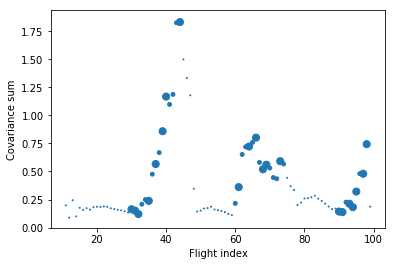

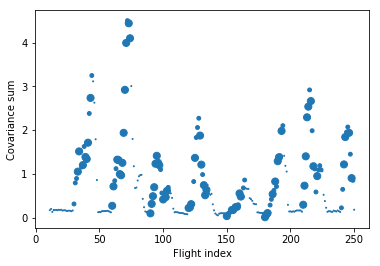

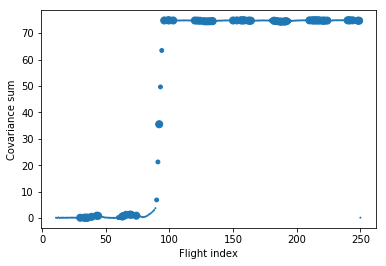

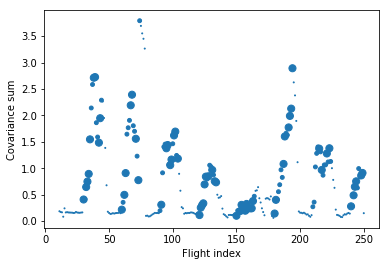

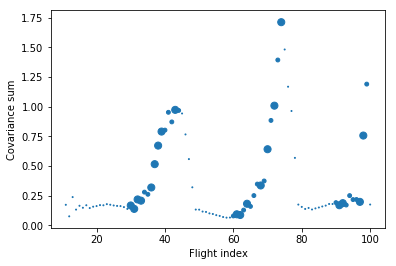

...

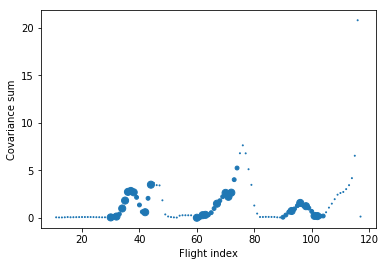

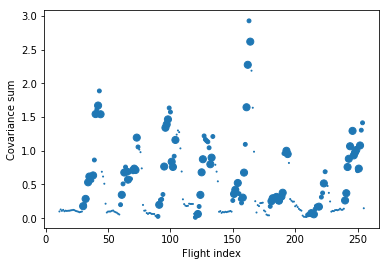

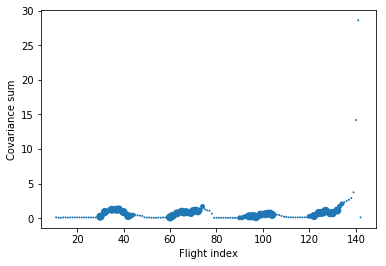

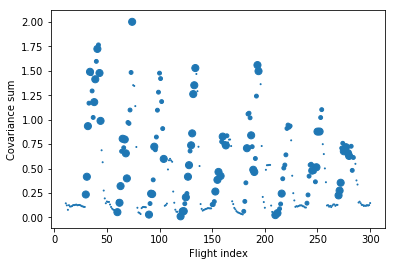

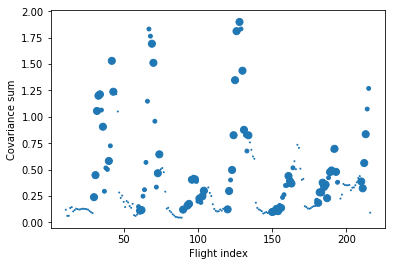

In [200]:
import matplotlib.pyplot as plt
for indices in indices_list:
    first, last, diff = indices
    plt.figure()
    curr_ind = range(11, diff+11+1)
    cov_sum = np.array(data_arr[first:last+1,4],dtype=np.float32)
    noise_coeff = np.ones(len(curr_ind))
    noise_list = np.abs(np.array(data_arr[first:last+1,3],dtype=np.float32))
    normal_noise = (noise_list < 1.0) & (noise_list > 0.5)
    great_noise = noise_list > 1.0
    noise_coeff[normal_noise] = 15
    noise_coeff[great_noise] = 50
    plt.scatter(curr_ind,cov_sum,s=noise_coeff)
    plt.xlabel("Flight index")
    plt.ylabel("Covariance sum")
    plt.show()

### Data distribution (Before)

In [44]:
print "Successfull flights: {0:.3} % ".format(len(data[data["Status"] == "SUCCESS"]) / float(len(data)) * 100)
print "Crashed flights: {0:.3} % ".format(len(data[data["Status"] == "CRASH"]) / float(len(data)) * 100)
print "Out of path flights: {0:.3} % ".format(len(data[data["Status"] == "OFF_ROAD"]) / float(len(data)) * 100)
print "Collided flights: {0:.3} % ".format(len(data[data["Status"] == "COLLISION"]) / float(len(data)) * 100)

print "\nMP Method distribution, before any restricions"
print "Rate of min_vel method in Flights: {0:.3} % ".format(len(data[(data["MP_Method"] == "min_vel") & (data["Status"] == "SUCCESS")]) / float(len(data)) * 100)
print "Rate of min_acc method in Flights: {0:.3} % ".format(len(data[(data["MP_Method"] == "min_acc") & (data["Status"] == "SUCCESS")]) / float(len(data)) * 100)
print "Rate of min_jerk method in Flights: {0:.3} % ".format(len(data[(data["MP_Method"] == "min_jerk") & (data["Status"] == "SUCCESS")]) / float(len(data)) * 100)
print "Rate of min_jerk_full_stop method in Flights: {0:.3} % ".format(len(data[(data["MP_Method"] == "min_jerk_full_stop") & (data["Status"] == "SUCCESS")]) / float(len(data)) * 100)
print "Rate of safe_mode in Flights {0:.3}".format(len(data[data["Status"] != "SUCCESS"]) / float(len(data)) * 100)

Successfull flights: 99.9 % 
Crashed flights: 0.0272 % 
Out of path flights: 0.0774 % 
Collided flights: 0.0265 % 

MP Method distribution, before any restricions
Rate of min_vel method in Flights: 12.7 % 
Rate of min_acc method in Flights: 23.4 % 
Rate of min_jerk method in Flights: 32.6 % 
Rate of min_jerk_full_stop method in Flights: 31.3 % 
Rate of safe_mode in Flights 0.131


### Data distribution (After)

In [45]:
median_cost = np.median(data["Cost"])
mean_cost = np.mean(data["Cost"])

data_coeff = 2.
median_data = data[data["Cost"] <= data_coeff*median_cost]
# median_data = data
unsucessful_flights = data[data["Status"] != "SUCCESS"]

print "Total length of dataset: " + str(median_data.shape)
# print "Percentage of flight points, whose cost is below {0:.3}*median: {1:.3} %".format(data_coeff, 100. * len(median_data) / len(data))
print "\nData distribution, after median value restriction"
print "Rate of min_vel method in Flights: {0:.3} % ".format(len(median_data[median_data["MP_Method"] == "min_vel"]) / float(len(median_data)) * 100)
print "Rate of min_acc method in Flights: {0:.3} % ".format(len(median_data[median_data["MP_Method"] == "min_acc"]) / float(len(median_data)) * 100)
print "Rate of min_jerk method in Flights: {0:.3} % ".format(len(median_data[median_data["MP_Method"] == "min_jerk"]) / float(len(median_data)) * 100)
print "Rate of min_jerk_full_stop method in Flights: {0:.3} % ".format(len(median_data[median_data["MP_Method"] == "min_jerk_full_stop"]) / float(len(median_data)) * 100)
print "Upper cost limit: {0:.6}".format(data_coeff*median_cost)

median_arr = median_data.values
unsuccessful_arr = unsucessful_flights.values

Total length of dataset: (119545, 26)

Data distribution, after median value restriction
Rate of min_vel method in Flights: 11.9 % 
Rate of min_acc method in Flights: 23.2 % 
Rate of min_jerk method in Flights: 33.1 % 
Rate of min_jerk_full_stop method in Flights: 31.7 % 
Upper cost limit: 29.4717


# Creating the dataset variable

In [46]:
algorithm_dict = {"min_vel":0, "min_acc":1, "min_jerk":2, "min_jerk_full_stop":3}
algorithms = ["min_vel", "min_acc", "min_jerk", "min_jerk_full_stop"]

successful_data = np.copy(median_data.values)
unsuccessful_data = np.copy(unsucessful_flights.values)
for i, data in enumerate(median_data.values):
    successful_data[i][22] = algorithm_dict[data[22]]
    
for i, data in enumerate(unsucessful_flights.values):
    unsuccessful_data[i][22] = 4
    
successful_classif = np.c_[successful_data[:,4:21], successful_data[:,22]]
unsuccessful_classif = np.c_[unsuccessful_data[:,4:21], unsuccessful_data[:,22]]
successful_regressor = np.c_[successful_data[:,4:21], successful_data[:,21]]
unsuccessful_regressor = np.c_[unsuccessful_data[:,4:21], unsuccessful_data[:,21]]

classification_dataset = np.r_[successful_classif, unsuccessful_classif]
regression_dataset = np.r_[successful_regressor, unsuccessful_regressor]

## Dataset Analysis

In [47]:
class_labels = {"min_vel":0, "min_acc":1, "min_jerk":2, "min_jerk_full_stop":3, "safe_mode":4}
N_length = float(classification_dataset.shape[0])
print "MP Dataset size: ",classification_dataset.shape
print "Regressor Dataset size: ",regression_dataset.shape 
print "N_min_vel: {0:.4}".format(np.sum(classification_dataset[:,-1] == class_labels["min_vel"]) / N_length * 100)
print "N_min_acc: {0:.4}".format(np.sum(classification_dataset[:,-1] == class_labels["min_acc"]) / N_length * 100)
print "N_min_jerk: {0:.4}".format(np.sum(classification_dataset[:,-1] == class_labels["min_jerk"]) / N_length * 100)
print "N_min_jerk_stop: {0:.4}".format(np.sum(classification_dataset[:,-1] == class_labels["min_jerk_full_stop"]) / N_length * 100)
print "N_safe_mode: {0:.4}".format(np.sum(classification_dataset[:,-1] == class_labels["safe_mode"]) / N_length * 100)

MP Dataset size:  (119733, 18)
Regressor Dataset size:  (119733, 18)
N_min_vel: 11.86
N_min_acc: 23.21
N_min_jerk: 33.09
N_min_jerk_stop: 31.69
N_safe_mode: 0.157


### Split of dataset as train, validation and test

In [48]:
N_Test = 15000
np.random.shuffle(classification_dataset) # Train 1
np.random.shuffle(regression_dataset) # Train 2

y1 = np.array(classification_dataset[:,-1],dtype=np.int)
y2 = np.array(regression_dataset[:,-1],dtype=np.float)
X1 = np.array(classification_dataset[:,:-1], dtype=np.float)
X2 = np.array(regression_dataset[:,:-1], dtype=np.float)

X1_test = X1[0:N_Test,:]
y1_test = y1[0:N_Test]
X2_test = X2[0:N_Test,:]
y2_test = y2[0:N_Test]

X1_train, X1_val, y1_train, y1_val = train_test_split(X1[N_Test:,:], y1[N_Test:], test_size=0.25, random_state=42)
X2_train, X2_val, y2_train, y2_val = train_test_split(X2[N_Test:,:], y2[N_Test:], test_size=0.25, random_state=42)
    
pickle.dump([X1_train, X1_val, X1_test, y1_train, y1_val, y1_test], open("classifier_files/dataset1.pkl","wb"), protocol=2)
pickle.dump([X2_train, X2_val, X2_test, y2_train, y2_val, y2_test], open("classifier_files/dataset2.pkl","wb"), protocol=2)

# scaler1,scaler2 = StandardScaler(), StandardScaler()
# scaler1.fit(X1_train)
# scaler2.fit(X2_train)
# X1_train, X2_train = scaler1.transform(X1_train), scaler2.transform(X2_train)
# X1_val, X2_val = scaler1.transform(X1_val), scaler2.transform(X2_val)
# X1_test, X2_test = scaler1.transform(X1_test), scaler2.transform(X2_test)

# dump(scaler1, 'classifier_files/mp_scaler.bin', compress=True)
# dump(scaler2, 'classifier_files/time_scaler.bin', compress=True)

print "X1_train: " + str(X1_train.shape) + " X2_train: " + str(X2_train.shape)
print "X1_val: " + str(X1_val.shape) + " X2_val: " + str(X2_val.shape) 
print "X1_test: " + str(X1_test.shape) + " X2_test: " + str(X2_test.shape) 

X1_train: (78549, 17) X2_train: (78549, 17)
X1_val: (26184, 17) X2_val: (26184, 17)
X1_test: (15000, 17) X2_test: (15000, 17)


### Train and predict functions

In [49]:
def predict(X, y, model, criterion, isClassifier):
    #Validation part
    model.eval()  # Set model to training mode
    
    inputs = torch.from_numpy(X).to(device)
    if isClassifier:
        labels = torch.from_numpy(y).to(device).long()
    else:
        labels = torch.from_numpy(y).to(device).float()

    outputs = model(inputs.float())
    if isClassifier:
        _, preds = torch.max(outputs, 1)

    loss = criterion(outputs, labels)
    
    if isClassifier:
        accuracy = torch.sum(preds == labels.data).item() / float(inputs.size(0))
        print "Test data, Loss: {0:.3}, Accuracy: {1:.4}".format(loss.item(), accuracy)
    else:
        print "Test data, Loss: {0:.3}\n".format(loss.item())
        print "Actual - Predicted"
        pred = outputs.detach().cpu().numpy()
        for i in range(y.shape[0]):
            print "{0:.3} - {1:.3}".format(y[i], outputs[i].item())
        
    

def shuffle_dataset(X, y):
    p = np.random.permutation(len(X))
    return X[p], y[p]

def train_model(isClassifier, X, y, X_val, y_val, model, criterion, optimizer, scheduler, minibatch_size, name, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_train_acc = 0.0
    best_acc = 0.0
    best_loss = 1e6
    best_train_loss = 1e6
    
    losses_train = []
    losses_val = []
    accuracy_train = []
    accuracy_val = []
    # path = F"/content/drive/My Drive/best_model.pt"
#     directory = path_name

#     if not os.path.exists(directory):
#         os.makedirs(directory)

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
        
        X_train, y_train = shuffle_dataset(X, y)

        # Each epoch has a training and validation phase
        model.train()  # Set model to training mode
        running_loss = 0.0
        running_corrects = 0
        losses_iter = []
        accuracy_iter = []

        # Iterate over data.
        for i in range(0, X_train.shape[0], minibatch_size):
            # Get pair of (X, y) of the current minibatch/chunk             
            X_batch = X_train[i:i + minibatch_size]
            y_batch = y_train[i:i + minibatch_size]

            # get the inputs; data is a list of [inputs, labels]
            xbatch = torch.from_numpy(X_batch).to(device)
            
            if isClassifier:
                ybatch = torch.from_numpy(y_batch).to(device).long()
            else:
                ybatch = torch.from_numpy(y_batch).to(device).float()


            # zero the parameter gradients
            optimizer.zero_grad()

            # forward
            # track history if only in train
            with torch.set_grad_enabled(True):
                pred = model(xbatch.float())
                if isClassifier:
                    _, preds = torch.max(pred, 1)
                
                loss = criterion(pred, ybatch)

                # backward + optimize only if in training phase
                loss.backward()
                optimizer.step()
            
            
            # statistics
            running_loss += loss.item() * xbatch.size(0)
            if isClassifier:
                running_corrects += torch.sum(preds == ybatch.data)

            # print ("losses_iter", loss.item() * inputs.size(0))
            # print ("accuracy_iter", torch.sum(preds == labels.data).item() / float(inputs.size(0)))

            losses_iter.append(loss.item())
            if isClassifier:
                accuracy_iter.append(torch.sum(preds == ybatch.data).item() / float(xbatch.size(0)))
        
        
        train_loss = np.mean(losses_iter)
        losses_train.append(train_loss)
        if isClassifier:
            train_acc = np.mean(accuracy_iter)
            accuracy_train.append(train_acc)
            print'Training Loss: {:.4f} Acc: {:.4f}'.format(train_loss, train_acc)  
        else:
            print'Training Loss: {:.4f}'.format(train_loss)
 
        
        
        #Validation part
        model.eval()  # Set model to training mode
        
        xbatch = torch.from_numpy(X_val).to(device)
        if isClassifier:
            ybatch = torch.from_numpy(y_val).to(device).long()
        else:
            ybatch = torch.from_numpy(y_val).to(device).float()
        
        optimizer.zero_grad()
        
        pred = model(xbatch.float())
        if isClassifier:
            _, preds = torch.max(pred, 1)

        loss = criterion(pred, ybatch)
        
        val_loss = loss.item()
        scheduler.step(val_loss)
        
        if isClassifier:
            val_acc = torch.sum(preds == ybatch.data).item() / float(xbatch.size(0))
            accuracy_val.append(val_acc)
        
        losses_val.append(val_loss)
        
        
        if isClassifier:
            print'Validation Loss: {:.4f} Acc: {:.4f}'.format(val_loss, val_acc)
        else:
            print'Validation Loss: {:.4f}'.format(val_loss)

#         deep copy the model
        if isClassifier:
            if val_acc > best_acc:
                best_train_acc = train_acc
                best_acc = val_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                path = name + "_best_model.pt"
                torch.save(best_model_wts, "classifier_files/" + path)
        else:
            if val_loss < best_loss:
                best_train_loss = train_loss
                best_loss = val_loss
                best_model_wts = copy.deepcopy(model.state_dict())
                path = name + "_best_model.pt"
                torch.save(best_model_wts, "classifier_files/" + path)

        print ""


    time_elapsed = time.time() - since
    print'Training complete in {:.0f}s'.format(time_elapsed)
    if isClassifier:
        print'Best Train Acc: {:4f}'.format(best_train_acc)
        print'Best Val Acc: {:4f}'.format(best_acc)
    else:
        print'Best Train Loss: {:4f}'.format(best_train_loss)
        print'Best Val Loss: {:4f}'.format(best_loss)

    
#     stats_columns = ['Layers', 'Epochs', 'BatchSize', 'LearningRate', 'Optimizer', 'Scheduler', 'TrainAcc', 'ValAcc']
#     layers = [module for module in model.modules() if type(module) != nn.Sequential]
#     write_results([layers, num_epochs, minibatch_size, learning_rate, optimizer.state_dict, scheduler.state_dict, best_train_acc, best_val_acc])

    # load best model weights
    model.load_state_dict(best_model_wts)
    
    return model

## MP Classifier Training

In [51]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.drop_layer = nn.Dropout(p=0.0)
        self.fc1 = nn.Linear(17, 128)
        self.fc2 = nn.Linear(128, 96)
        self.fc3 = nn.Linear(96, 64)
        self.fc4 = nn.Linear(64, 48)
        self.fc5 = nn.Linear(48, 36)
        self.fc6 = nn.Linear(36, 24)
        self.fc7 = nn.Linear(24, 18)
        self.fc8 = nn.Linear(18, 5)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.drop_layer(x)
        x = F.relu(self.fc2(x))
        x = self.drop_layer(x)
        x = F.relu(self.fc3(x))
        x = self.drop_layer(x)
        x = F.relu(self.fc4(x))
        x = self.drop_layer(x)
        x = F.relu(self.fc5(x))
        x = self.drop_layer(x)
        x = F.relu(self.fc6(x))
        x = self.drop_layer(x)
        x = F.relu(self.fc7(x))
        x = self.drop_layer(x)
        x = self.fc8(x)
        return x

n_epochs = 100
minibatch_size = 16
learning_rate = 0.001
# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = torch.device("cpu")
model = Net()
model = model.to(device)
ce_criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
# scheduler = lr_scheduler.CosineAnnealingLR(optimizer, X_train.shape[0], eta_min=learning_rate)
scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, 'min')
mp_model = train_model(True, X1_train, y1_train, X1_val, y1_val, model, ce_criterion, optimizer, scheduler, minibatch_size, "mp_classifier", num_epochs=n_epochs)

Epoch 0/99
----------
Training Loss: 0.6493 Acc: 0.6223
Validation Loss: 0.5664 Acc: 0.6549

Epoch 1/99
----------
Training Loss: 0.5481 Acc: 0.6511
Validation Loss: 0.5335 Acc: 0.6605

Epoch 2/99
----------
Training Loss: 0.5340 Acc: 0.6558
Validation Loss: 0.5408 Acc: 0.6567

Epoch 3/99
----------
Training Loss: 0.5256 Acc: 0.6587
Validation Loss: 0.5164 Acc: 0.6613

Epoch 4/99
----------
Training Loss: 0.5197 Acc: 0.6591
Validation Loss: 0.5170 Acc: 0.6523

Epoch 5/99
----------
Training Loss: 0.5143 Acc: 0.6604
Validation Loss: 0.5127 Acc: 0.6518

Epoch 6/99
----------
Training Loss: 0.5100 Acc: 0.6614
Validation Loss: 0.5053 Acc: 0.6667

Epoch 7/99
----------
Training Loss: 0.5068 Acc: 0.6631
Validation Loss: 0.5025 Acc: 0.6695

Epoch 8/99
----------
Training Loss: 0.5047 Acc: 0.6634
Validation Loss: 0.5023 Acc: 0.6703

Epoch 9/99
----------
Training Loss: 0.5019 Acc: 0.6643
Validation Loss: 0.5095 Acc: 0.6538

Epoch 10/99
----------
Training Loss: 0.5006 Acc: 0.6692
Validation Lo

Training Loss: 0.2782 Acc: 0.8705
Validation Loss: 0.4339 Acc: 0.8415

Epoch 89/99
----------
Training Loss: 0.2708 Acc: 0.8730
Validation Loss: 0.3889 Acc: 0.8496

Epoch 90/99
----------
Training Loss: 0.2713 Acc: 0.8736
Validation Loss: 0.5099 Acc: 0.8055

Epoch 91/99
----------
Training Loss: 0.2665 Acc: 0.8755
Validation Loss: 0.3642 Acc: 0.8530

Epoch 92/99
----------
Training Loss: 0.2631 Acc: 0.8766
Validation Loss: 0.3708 Acc: 0.8651

Epoch 93/99
----------
Training Loss: 0.2620 Acc: 0.8780
Validation Loss: 0.4039 Acc: 0.8652

Epoch 94/99
----------
Training Loss: 0.2654 Acc: 0.8785
Validation Loss: 0.4252 Acc: 0.8515

Epoch 95/99
----------
Training Loss: 0.2582 Acc: 0.8816
Validation Loss: 0.3943 Acc: 0.8593

Epoch 96/99
----------
Training Loss: 0.2022 Acc: 0.9064
Validation Loss: 0.3618 Acc: 0.8850

Epoch 97/99
----------
Training Loss: 0.1823 Acc: 0.9155
Validation Loss: 0.3706 Acc: 0.8897

Epoch 98/99
----------
Training Loss: 0.1757 Acc: 0.9192
Validation Loss: 0.3844 Ac

In [52]:
print "Test Results for MP Classification"
predict(X1_test, y1_test, mp_model, ce_criterion, True)

Test Results for MP Classification
Test data, Loss: 1.02, Accuracy: 0.8887


## Time Regressor Training

In [38]:
class Net_Regressor(nn.Module):
    def __init__(self):
        super(Net_Regressor, self).__init__()
        self.drop_layer = nn.Dropout(p=0.01)
        self.fc1 = nn.Linear(17, 128)
        self.fc2 = nn.Linear(128, 96)
        self.fc3 = nn.Linear(96, 64)
        self.fc4 = nn.Linear(64, 48)
        self.fc5 = nn.Linear(48, 36)
        self.fc6 = nn.Linear(36, 24)
        self.fc7 = nn.Linear(24, 18)
        self.fc8 = nn.Linear(18, 1)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.drop_layer(x)
        x = F.relu(self.fc2(x))
        x = self.drop_layer(x)
        x = F.relu(self.fc3(x))
        x = self.drop_layer(x)
        x = F.relu(self.fc4(x))
        x = self.drop_layer(x)
        x = F.relu(self.fc5(x))
        x = self.drop_layer(x)
        x = F.relu(self.fc6(x))
        x = self.drop_layer(x)
        x = F.relu(self.fc7(x))
        x = self.drop_layer(x)
        x = self.fc8(x)
        return x
    
    
scaler2 = StandardScaler()
scaler2.fit(X2_train)
X2_train = scaler2.transform(X2_train)
X2_val = scaler2.transform(X2_val)
X2_test = scaler2.transform(X2_test)

    
n_epochs = 30
minibatch_size = 16
learning_rate = 0.001
# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = torch.device("cpu")
model = Net_Regressor()
model = model.to(device)
mse_criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
# scheduler = lr_scheduler.CosineAnnealingLR(optimizer, X_train.shape[0], eta_min=learning_rate)
scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, 'min')
time_model = train_model(False, X2_train, y2_train, X2_val, y2_val, model, mse_criterion, optimizer, scheduler, minibatch_size, 'time_regressor', num_epochs=n_epochs)

Epoch 0/29
----------
Training Loss: 7.0321
Validation Loss: 6.7303

Epoch 1/29
----------
Training Loss: 6.3214
Validation Loss: 6.3126

Epoch 2/29
----------
Training Loss: 6.2586
Validation Loss: 6.4156

Epoch 3/29
----------
Training Loss: 6.2305
Validation Loss: 6.2913

Epoch 4/29
----------
Training Loss: 6.2160
Validation Loss: 6.3892

Epoch 5/29
----------
Training Loss: 6.2121
Validation Loss: 6.2958

Epoch 6/29
----------
Training Loss: 6.2064
Validation Loss: 6.2949

Epoch 7/29
----------
Training Loss: 6.2025
Validation Loss: 6.3008

Epoch 8/29
----------
Training Loss: 6.1998
Validation Loss: 6.3084

Epoch 9/29
----------
Training Loss: 6.2025
Validation Loss: 6.3301

Epoch 10/29
----------
Training Loss: 6.2039
Validation Loss: 6.4089

Epoch 11/29
----------
Training Loss: 6.2012
Validation Loss: 6.3096

Epoch 12/29
----------
Training Loss: 6.1948
Validation Loss: 6.2914

Epoch 13/29
----------
Training Loss: 6.1888
Validation Loss: 6.3128

Epoch 14/29
----------
Trainin

In [39]:
print "Test Results for Time Regression"
predict(X2_test, y2_test, time_model, mse_criterion, False)

Test Results for Time Regression
Test data, Loss: 6.26

Actual - Predicted
7.75 - 4.96
7.11 - 4.95
6.49 - 4.94
6.73 - 4.93
8.96 - 4.97
5.15 - 4.84
6.0 - 4.95
9.09 - 4.99
9.42 - 4.96
2.97 - 4.73
2.39 - 4.77
7.7 - 4.97
4.05 - 4.81
3.73 - 4.86
3.27 - 4.86
6.28 - 4.89
5.65 - 4.89
4.88 - 4.78
0.189 - 4.66
7.32 - 4.99
4.05 - 4.87
4.32 - 4.78
2.92 - 4.71
4.02 - 4.78
3.24 - 4.75
1.65 - 4.7
8.95 - 4.95
5.86 - 4.97
7.32 - 4.9
8.91 - 4.96
7.63 - 4.94
0.514 - 4.66
5.43 - 4.96
5.35 - 4.94
3.7 - 4.85
4.86 - 4.82
3.77 - 4.76
7.16 - 4.91
5.61 - 4.87
5.86 - 4.89
5.96 - 4.94
0.189 - 4.66
8.11 - 4.94
0.179 - 4.66
3.66 - 4.83
4.02 - 4.81
5.29 - 4.85
0.381 - 4.66
5.57 - 4.93
9.32 - 4.97
8.34 - 4.95
6.85 - 4.98
6.01 - 4.95
2.96 - 4.78
7.09 - 4.96
4.5 - 4.85
2.85 - 4.79
8.19 - 4.97
0.185 - 4.66
8.58 - 4.95
7.86 - 4.94
6.3 - 4.87
0.178 - 4.65
0.82 - 4.67
0.208 - 4.67
6.49 - 4.96
7.5 - 4.93
3.83 - 4.78
2.41 - 4.78
3.11 - 4.79
4.86 - 4.89
5.0 - 4.92
6.99 - 4.93
6.5 - 4.93
6.91 - 4.9
4.33 - 4.8
6.66 - 4.95
4.76 

0.196 - 4.66
7.22 - 4.95
4.52 - 4.83
7.45 - 4.94
0.207 - 4.66
5.28 - 4.87
5.78 - 4.68
1.96 - 4.71
4.95 - 4.89
0.49 - 4.67
9.19 - 4.95
7.26 - 4.97
6.41 - 4.92
7.76 - 4.96
6.44 - 4.89
5.76 - 4.86
7.47 - 4.93
4.85 - 4.83
4.08 - 4.77
3.37 - 4.85
6.93 - 4.95
0.463 - 4.67
8.31 - 4.99
0.184 - 4.66
3.23 - 4.76
4.55 - 4.91
5.99 - 4.92
8.9 - 4.96
2.48 - 4.74
2.51 - 4.69
4.7 - 4.83
5.89 - 4.87
0.185 - 4.66
7.29 - 4.95
2.79 - 4.75
8.34 - 4.96
6.56 - 4.95
7.09 - 4.91
4.86 - 4.9
4.69 - 4.93
4.89 - 4.85
3.23 - 4.74
0.212 - 4.66
0.163 - 4.66
4.25 - 4.85
5.84 - 4.91
5.73 - 4.9
5.24 - 4.91
8.97 - 4.94
8.28 - 4.98
5.29 - 4.84
6.03 - 4.88
3.99 - 4.78
4.68 - 4.95
3.3 - 4.88
6.79 - 4.97
5.8 - 4.89
6.27 - 4.95
7.82 - 4.96
7.58 - 4.93
0.632 - 4.68
7.7 - 4.97
3.5 - 4.8
3.2 - 4.83
6.27 - 4.91
1.29 - 4.67
4.33 - 4.84
2.5 - 4.71
6.92 - 4.94
4.66 - 4.88
9.48 - 4.95
7.01 - 4.93
7.06 - 4.96
0.215 - 4.66
4.33 - 4.87
5.26 - 4.92
8.63 - 4.99
4.48 - 4.83
4.65 - 4.86
3.72 - 4.74
2.56 - 4.7
5.82 - 4.95
4.43 - 4.84
7.47 - 

## Decision Tree Design as Time Regressor

In [53]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score


regressor = DecisionTreeRegressor(max_depth=15)
regressor.fit(X2_train, y2_train)
y2_pred = regressor.predict(X2_val)
loss = np.sum((y2_val - y2_pred)**2) / y2_val.shape[0]

dump(regressor, 'classifier_files/dt_regressor.sav')

print "Results of validation data"
print "Current Loss: {0:.4}".format(loss)
print "\nActual - Predicted"
for i in range(y2_val.shape[0]):
    print "{0:.3} - {1:.3}".format(y2_val[i], y2_pred[i])

Results of validation data
Current Loss: 0.003345

Actual - Predicted
4.81 - 4.81
2.75 - 2.76
4.58 - 4.59
3.49 - 3.5
3.44 - 3.45
4.16 - 4.16
3.7 - 3.72
4.38 - 4.38
5.79 - 5.79
0.279 - 0.273
3.54 - 3.54
4.03 - 4.02
4.43 - 4.44
3.56 - 3.56
3.92 - 3.93
3.79 - 3.8
2.34 - 2.33
3.81 - 3.72
2.77 - 2.82
0.349 - 0.353
0.17 - 0.17
6.17 - 6.21
2.66 - 2.66
5.74 - 5.74
2.71 - 2.72
3.73 - 3.75
4.53 - 4.47
4.39 - 4.39
0.17 - 0.17
0.17 - 0.17
4.34 - 4.34
0.17 - 0.17
4.35 - 4.37
4.54 - 4.53
1.1 - 1.11
5.09 - 5.09
5.63 - 5.64
1.76 - 1.76
5.88 - 5.77
5.1 - 5.1
6.19 - 6.14
4.59 - 4.57
2.3 - 2.3
6.35 - 6.35
4.19 - 4.19
1.02 - 1.02
0.849 - 0.814
3.41 - 3.41
2.2 - 2.2
4.78 - 4.78
3.65 - 3.65
3.03 - 3.02
2.78 - 2.82
3.2 - 3.2
1.32 - 1.32
4.16 - 4.16
4.68 - 4.69
3.81 - 3.8
4.86 - 4.97
4.28 - 4.29
3.06 - 3.07
4.97 - 4.99
3.14 - 3.16
2.45 - 2.43
2.51 - 2.51
4.38 - 4.38
2.12 - 2.12
5.53 - 5.54
6.02 - 5.76
2.7 - 2.71
4.9 - 4.9
4.75 - 4.75
4.32 - 4.32
3.88 - 3.88
4.45 - 4.44
4.66 - 4.66
2.4 - 2.39
4.57 - 4.57
5.67 

2.25 - 2.27
3.53 - 3.54
3.55 - 3.55
4.52 - 4.52
4.62 - 4.62
0.17 - 0.17
4.93 - 4.94
3.74 - 3.77
3.66 - 3.66
3.95 - 3.95
0.981 - 0.956
4.81 - 4.83
4.28 - 4.29
5.03 - 5.03
3.81 - 3.81
4.28 - 4.26
5.25 - 5.25
0.17 - 0.17
3.96 - 3.97
0.301 - 0.302
4.97 - 4.94
6.06 - 6.05
4.07 - 4.07
4.55 - 4.55
4.25 - 4.23
5.17 - 5.18
5.66 - 5.64
4.54 - 4.54
0.295 - 0.294
4.9 - 4.89
5.08 - 5.09
5.04 - 5.05
3.61 - 3.62
4.3 - 4.33
5.55 - 5.55
4.78 - 4.78
2.22 - 2.23
3.49 - 3.5
2.95 - 2.96
4.88 - 4.88
3.27 - 3.17
1.97 - 1.98
4.14 - 4.13
0.944 - 0.946
5.63 - 5.63
3.47 - 3.47
3.37 - 3.37
4.58 - 4.58
0.17 - 0.17
5.11 - 5.13
5.26 - 5.26
2.36 - 2.36
0.17 - 0.17
3.95 - 3.95
5.55 - 5.54
4.9 - 4.89
3.96 - 3.96
3.41 - 3.4
0.332 - 0.339
5.18 - 5.34
4.39 - 4.4
5.53 - 5.54
4.76 - 4.76
2.97 - 2.98
5.71 - 5.7
0.203 - 0.209
4.54 - 4.53
6.28 - 6.3
5.24 - 5.24
1.8 - 1.82
4.02 - 4.0
4.41 - 4.44
2.46 - 2.46
6.04 - 6.02
2.56 - 2.36
2.85 - 2.85
3.85 - 3.85
3.98 - 3.98
2.34 - 2.35
2.13 - 2.12
3.93 - 3.93
3.97 - 3.97
4.25 - 4.23
3.

3.48 - 3.48
4.88 - 4.91
5.5 - 5.51
1.32 - 1.32
3.97 - 3.95
4.06 - 4.05
4.3 - 4.31
4.09 - 4.08
0.644 - 0.64
4.69 - 4.69
4.72 - 4.71
3.07 - 3.11
0.17 - 0.17
3.94 - 3.93
5.47 - 5.47
5.12 - 5.12
3.49 - 3.49
1.2 - 1.22
3.84 - 3.84
3.26 - 3.26
3.39 - 3.39
2.31 - 2.3
3.32 - 3.31
4.49 - 4.5
5.05 - 5.05
3.91 - 3.88
4.58 - 4.57
5.99 - 5.99
0.913 - 0.91
3.72 - 3.73
3.82 - 3.82
4.82 - 4.83
2.37 - 2.37
1.07 - 1.09
0.17 - 0.17
4.36 - 4.36
3.02 - 3.02
2.65 - 2.62
6.2 - 6.2
2.86 - 2.88
2.93 - 3.07
5.11 - 5.11
1.78 - 1.76
0.965 - 0.946
2.8 - 2.87
1.14 - 1.16
5.04 - 5.05
2.69 - 2.66
3.98 - 4.01
2.8 - 2.8
5.31 - 5.3
0.405 - 0.395
4.17 - 4.16
6.33 - 6.34
6.21 - 6.2
5.81 - 5.81
4.33 - 4.34
3.16 - 3.14
4.47 - 4.46
4.48 - 4.48
4.25 - 4.26
2.58 - 2.59
0.17 - 0.17
4.87 - 4.87
2.48 - 2.48
4.37 - 4.38
5.6 - 5.61
3.45 - 3.45
4.57 - 4.57
3.7 - 3.72
4.62 - 4.61
3.55 - 3.53
4.65 - 4.67
1.04 - 1.02
3.75 - 3.75
1.86 - 1.86
4.01 - 3.97
4.06 - 4.08
3.56 - 3.57
2.25 - 2.29
4.64 - 4.6
4.51 - 4.5
3.25 - 3.25
2.37 - 2.37
0.

4.3 - 4.3
3.53 - 3.51
2.53 - 2.54
0.17 - 0.17
1.72 - 1.73
4.03 - 4.0
2.03 - 2.02
5.9 - 5.9
3.66 - 3.66
0.17 - 0.171
0.17 - 0.17
1.04 - 1.03
4.53 - 4.53
3.54 - 3.54
3.44 - 3.44
5.06 - 5.06
2.57 - 2.57
3.84 - 3.84
1.69 - 1.65
3.3 - 3.31
4.17 - 4.15
2.61 - 2.6
2.47 - 2.47
2.53 - 2.53
3.84 - 3.84
3.17 - 3.18
0.17 - 0.17
3.18 - 3.16
5.66 - 5.66
2.67 - 2.67
4.67 - 4.66
1.22 - 1.23
1.11 - 1.11
3.31 - 3.3
4.46 - 4.47
1.69 - 1.68
4.62 - 4.62
2.61 - 2.57
0.436 - 0.438
3.16 - 3.15
5.72 - 5.72
3.43 - 3.43
2.45 - 2.45
0.75 - 0.711
3.99 - 4.0
2.55 - 2.53
3.11 - 3.11
5.58 - 5.58
7.02 - 6.71
3.96 - 3.96
4.72 - 4.74
3.73 - 3.72
4.54 - 4.53
6.09 - 6.1
3.04 - 3.03
4.15 - 4.14
5.94 - 5.93
3.02 - 2.98
2.43 - 2.43
0.877 - 0.914
4.56 - 4.56
4.64 - 4.64
2.82 - 2.83
4.69 - 4.69
1.94 - 1.58
5.9 - 5.93
3.92 - 3.93
4.51 - 4.47
3.62 - 3.63
4.95 - 4.93
2.98 - 2.98
1.22 - 1.22
2.47 - 2.47
2.94 - 2.85
5.02 - 5.02
4.99 - 4.99
0.17 - 0.17
0.178 - 0.175
4.55 - 4.54
0.601 - 0.611
4.79 - 4.8
4.12 - 4.08
3.02 - 3.01
4.22 -

3.06 - 3.04
4.75 - 4.74
5.26 - 5.22
5.41 - 5.39
5.28 - 5.31
2.56 - 2.68
5.4 - 5.4
4.43 - 4.43
0.826 - 0.776
3.03 - 3.04
4.27 - 4.27
5.24 - 5.24
5.06 - 5.06
3.85 - 3.85
0.17 - 0.17
5.93 - 5.93
4.96 - 4.96
3.05 - 3.05
6.24 - 6.23
0.19 - 0.192
4.54 - 4.54
4.59 - 4.59
4.16 - 4.16
1.06 - 1.09
5.92 - 5.91
0.17 - 0.17
0.17 - 0.17
3.47 - 3.49
4.42 - 4.42
3.59 - 3.57
4.58 - 4.6
4.05 - 4.06
0.17 - 0.17
3.17 - 3.16
6.5 - 6.51
6.03 - 6.02
4.91 - 4.91
3.81 - 3.82
1.34 - 1.32
3.8 - 3.79
4.62 - 4.61
5.46 - 5.49
3.84 - 3.84
1.58 - 1.59
3.59 - 3.58
3.91 - 3.9
5.08 - 5.06
4.3 - 4.3
0.17 - 0.17
3.38 - 3.37
4.16 - 4.15
3.74 - 3.71
5.12 - 5.12
5.51 - 5.51
3.59 - 3.57
5.51 - 5.51
4.37 - 4.38
2.28 - 2.28
3.72 - 3.72
4.02 - 4.02
4.19 - 4.19
5.86 - 5.86
1.77 - 1.76
0.17 - 0.17
5.57 - 5.57
4.38 - 4.38
0.17 - 0.17
3.81 - 3.82
5.84 - 5.84
5.07 - 5.08
6.4 - 6.4
2.64 - 2.64
5.57 - 5.58
5.46 - 5.45
2.84 - 2.85
4.71 - 4.72
1.94 - 1.95
5.12 - 5.11
4.99 - 5.02
3.7 - 3.64
5.59 - 5.57
0.895 - 0.894
4.11 - 4.11
4.56 - 4.5

4.75 - 4.76
4.95 - 4.95
2.68 - 2.68
5.36 - 5.35
3.23 - 3.26
4.57 - 4.57
3.32 - 3.31
3.93 - 4.09
2.61 - 2.61
1.86 - 1.86
3.49 - 3.5
4.48 - 4.48
5.37 - 5.38
3.63 - 3.64
3.31 - 3.28
3.3 - 3.37
4.96 - 4.99
0.17 - 0.17
1.45 - 1.46
3.66 - 3.67
3.26 - 3.27
5.37 - 5.38
3.59 - 3.6
0.17 - 0.17
5.79 - 5.79
4.28 - 4.3
3.29 - 3.29
3.46 - 3.42
5.0 - 5.01
6.39 - 6.41
4.57 - 4.57
1.26 - 1.28
5.18 - 4.69
4.09 - 4.1
5.0 - 4.99
4.49 - 4.51
4.13 - 4.13
6.17 - 6.16
3.36 - 3.36
4.74 - 4.76
3.94 - 3.95
6.49 - 6.52
0.17 - 0.17
4.77 - 4.64
3.48 - 3.48
2.84 - 2.83
1.94 - 1.94
2.74 - 2.68
3.54 - 3.54
3.67 - 3.67
4.9 - 4.9
3.32 - 3.32
3.84 - 3.85
5.95 - 5.96
3.89 - 3.9
2.78 - 2.79
2.89 - 2.89
4.99 - 4.99
5.34 - 5.33
3.68 - 3.68
1.65 - 1.65
6.02 - 5.99
2.28 - 2.28
3.41 - 3.41
0.17 - 0.17
1.06 - 1.08
4.66 - 4.66
4.07 - 4.06
6.34 - 6.31
2.91 - 2.9
5.43 - 5.46
6.43 - 6.45
2.65 - 2.64
2.26 - 2.26
0.313 - 0.311
4.33 - 4.33
5.4 - 5.4
4.73 - 4.7
3.64 - 3.68
3.43 - 3.43
4.88 - 4.88
3.72 - 3.71
4.43 - 4.33
5.03 - 5.03
4.69

2.31 - 2.32
4.74 - 4.73
4.49 - 4.48
3.53 - 3.52
1.62 - 1.61
6.23 - 6.24
6.18 - 6.18
3.34 - 3.33
3.66 - 3.67
4.0 - 4.0
0.691 - 0.718
4.85 - 4.85
3.78 - 3.78
1.78 - 1.74
5.83 - 5.83
4.72 - 4.73
4.51 - 4.5
0.961 - 0.98
4.52 - 4.5
0.17 - 0.17
4.25 - 4.25
0.274 - 0.282
3.55 - 3.52
5.68 - 5.68
1.51 - 1.56
4.53 - 4.52
5.47 - 5.44
2.34 - 2.34
3.15 - 3.15
2.86 - 2.86
5.67 - 5.65
2.08 - 2.09
5.08 - 5.08
4.6 - 4.57
4.96 - 4.96
3.71 - 3.72
2.33 - 2.35
4.82 - 4.85
0.17 - 0.17
3.07 - 3.05
5.19 - 5.22
1.87 - 1.88
4.22 - 4.22
5.26 - 5.26
5.02 - 5.02
0.469 - 0.458
4.55 - 4.56
3.91 - 3.91
3.22 - 3.22
4.33 - 4.34
3.95 - 3.95
3.62 - 3.62
4.23 - 4.23
5.06 - 5.06
3.01 - 3.0
5.45 - 5.45
5.58 - 5.57
2.96 - 2.96
6.35 - 6.21
4.24 - 4.24
4.81 - 4.81
4.07 - 4.06
4.9 - 4.92
4.38 - 4.38
3.89 - 3.89
3.53 - 3.52
3.68 - 3.72
5.91 - 5.91
2.53 - 2.53
3.68 - 3.68
0.17 - 0.17
4.53 - 4.53
0.17 - 0.17
4.21 - 4.21
0.17 - 0.17
5.07 - 5.05
5.95 - 5.96
3.47 - 3.46
3.43 - 3.45
6.4 - 6.4
3.85 - 3.87
3.52 - 3.52
3.05 - 3.07
3.26 -

4.32 - 4.32
1.95 - 1.96
0.17 - 0.17
4.52 - 4.51
3.15 - 3.16
0.313 - 0.319
4.67 - 4.64
2.45 - 2.48
4.58 - 4.59
2.32 - 2.31
3.83 - 3.84
1.5 - 1.51
4.77 - 4.75
6.43 - 6.44
2.87 - 2.88
3.87 - 3.89
0.781 - 0.799
2.88 - 2.88
3.44 - 3.44
4.47 - 4.51
3.94 - 3.93
4.72 - 4.73
4.73 - 4.74
4.27 - 4.27
3.95 - 3.95
4.54 - 4.47
3.39 - 3.38
0.668 - 0.664
4.84 - 4.83
3.93 - 3.9
2.03 - 2.03
6.12 - 6.12
5.92 - 5.92
4.42 - 4.42
5.23 - 5.24
2.39 - 2.39
3.83 - 3.75
6.39 - 6.39
3.21 - 3.22
3.32 - 3.37
3.92 - 3.92
5.59 - 5.6
4.35 - 4.36
1.58 - 1.59
2.63 - 2.63
6.07 - 6.06
3.03 - 3.03
4.37 - 4.36
5.23 - 5.23
2.3 - 2.3
2.66 - 2.66
5.06 - 5.06
4.83 - 4.85
5.26 - 5.26
4.11 - 4.1
2.83 - 2.88
2.12 - 2.06
0.17 - 0.17
5.79 - 5.79
0.17 - 0.17
2.05 - 2.06
3.98 - 3.96
5.14 - 5.14
4.57 - 4.55
5.11 - 5.1
3.25 - 3.25
1.14 - 1.15
4.76 - 4.75
1.37 - 1.37
5.32 - 5.28
6.0 - 5.7
4.51 - 4.5
4.13 - 4.13
4.84 - 4.85
5.32 - 5.32
3.32 - 3.31
5.75 - 5.75
3.46 - 3.45
5.79 - 5.81
3.09 - 3.09
0.661 - 0.664
2.49 - 2.49
2.73 - 2.75
6.01 -

5.12 - 5.14
2.68 - 2.66
3.94 - 3.99
0.17 - 0.17
3.6 - 3.61
2.33 - 2.34
3.89 - 3.88
3.74 - 3.69
3.0 - 2.84
3.41 - 3.43
5.18 - 5.19
3.82 - 3.82
4.64 - 4.64
2.73 - 2.74
0.863 - 0.864
2.28 - 2.28
3.17 - 3.16
3.56 - 3.57
4.98 - 4.99
0.321 - 0.319
4.27 - 4.26
1.91 - 1.92
6.35 - 6.35
4.87 - 5.03
5.99 - 6.0
5.41 - 5.42
5.55 - 5.55
4.45 - 4.45
3.62 - 3.64
5.21 - 5.2
2.9 - 2.9
2.82 - 2.8
6.51 - 6.55
5.36 - 5.34
4.25 - 4.26
4.15 - 4.15
3.65 - 3.64
1.3 - 1.32
5.25 - 5.26
5.64 - 5.64
4.11 - 3.96
4.46 - 4.46
0.17 - 0.17
3.09 - 3.1
1.75 - 1.76
4.95 - 4.93
5.52 - 5.52
5.66 - 5.66
4.46 - 4.45
4.42 - 4.47
4.88 - 4.9
4.96 - 4.95
3.92 - 3.91
2.91 - 2.92
6.19 - 6.2
4.45 - 4.45
6.24 - 6.23
2.97 - 2.92
2.74 - 2.75
4.36 - 4.38
0.49 - 0.519
0.312 - 0.303
5.63 - 5.64
5.35 - 5.35
3.0 - 3.05
3.86 - 3.86
0.737 - 0.747
5.9 - 5.9
0.17 - 0.17
4.69 - 4.7
0.17 - 0.17
3.74 - 3.72
3.23 - 3.23
4.09 - 4.09
4.62 - 4.62
3.04 - 3.05
0.708 - 0.824
4.04 - 4.04
0.17 - 0.17
3.62 - 3.64
2.13 - 2.16
4.71 - 4.71
4.61 - 4.62
4.66 - 4

In [63]:
y2_pred = regressor.predict(X2_test)
loss = np.sum((y2_test - y2_pred)**2) / y2_test.shape[0]
print "Results of test data"
print "Current Loss: {0:.4}".format(loss)
print "\nActual - Predicted"
for i in range(y2_test.shape[0]):
    print "{0:.3} - {1:.3}".format(y2_test[i], y2_pred[i])

Results of test data
Current Loss: 0.2342

Actual - Predicted
7.75 - 7.8
7.11 - 7.14
6.49 - 6.44
6.73 - 6.64
8.96 - 9.09
5.15 - 3.65
6.0 - 5.9
9.09 - 8.9
9.42 - 9.25
2.97 - 3.01
2.39 - 2.25
7.7 - 7.67
4.05 - 3.93
3.73 - 3.81
3.27 - 3.2
6.28 - 6.35
5.65 - 6.53
4.88 - 4.78
0.189 - 0.193
7.32 - 7.09
4.05 - 4.5
4.32 - 4.64
2.92 - 2.61
4.02 - 3.85
3.24 - 3.28
1.65 - 1.7
8.95 - 8.8
5.86 - 5.93
7.32 - 7.31
8.91 - 8.87
7.63 - 7.7
0.514 - 0.637
5.43 - 5.43
5.35 - 5.23
3.7 - 3.65
4.86 - 4.85
3.77 - 4.14
7.16 - 7.18
5.61 - 5.8
5.86 - 5.92
5.96 - 5.29
0.189 - 0.192
8.11 - 8.04
0.179 - 0.192
3.66 - 2.68
4.02 - 4.14
5.29 - 5.35
0.381 - 0.38
5.57 - 5.52
9.32 - 9.45
8.34 - 8.87
6.85 - 6.49
6.01 - 5.95
2.96 - 2.33
7.09 - 7.09
4.5 - 4.53
2.85 - 3.23
8.19 - 8.13
0.185 - 0.193
8.58 - 8.57
7.86 - 7.8
6.3 - 4.55
0.178 - 0.199
0.82 - 0.918
0.208 - 0.205
6.49 - 6.55
7.5 - 8.23
3.83 - 4.01
2.41 - 2.39
3.11 - 3.0
4.86 - 4.66
5.0 - 4.96
6.99 - 7.06
6.5 - 6.52
6.91 - 6.84
4.33 - 4.16
6.66 - 6.69
4.76 - 4.76
5.96 

2.86 - 2.73
9.18 - 9.32
3.6 - 3.51
5.55 - 5.31
5.65 - 5.72
7.55 - 7.45
7.21 - 7.24
2.63 - 3.99
2.84 - 2.73
7.09 - 7.13
8.47 - 8.24
4.63 - 3.41
7.86 - 7.64
0.181 - 0.176
6.66 - 6.78
0.165 - 0.161
3.48 - 3.77
5.02 - 5.03
4.06 - 4.23
4.99 - 4.87
3.63 - 3.74
3.23 - 2.69
7.05 - 7.09
7.2 - 7.19
0.187 - 0.201
7.47 - 7.43
3.9 - 3.9
2.93 - 2.96
5.53 - 5.43
6.44 - 6.36
0.164 - 0.171
9.22 - 8.24
0.464 - 0.414
6.85 - 6.83
0.741 - 0.842
6.91 - 6.96
5.76 - 5.6
4.29 - 4.28
8.77 - 8.74
0.631 - 0.692
3.06 - 3.47
9.39 - 9.41
5.52 - 5.55
5.98 - 5.74
8.16 - 8.11
3.49 - 3.46
6.95 - 7.01
1.09 - 0.995
4.31 - 4.03
6.59 - 6.54
6.47 - 6.54
0.17 - 0.171
3.55 - 3.57
7.17 - 7.09
5.03 - 4.36
6.28 - 6.3
6.88 - 6.56
4.36 - 4.48
2.27 - 2.29
0.184 - 0.199
7.52 - 7.58
1.05 - 1.07
7.17 - 7.3
3.67 - 3.68
7.77 - 7.79
4.12 - 4.06
6.68 - 6.55
0.219 - 0.192
3.46 - 3.42
4.9 - 4.91
1.93 - 1.72
4.46 - 4.35
5.98 - 6.15
5.14 - 5.91
8.76 - 8.42
4.16 - 4.1
2.43 - 2.39
4.39 - 4.09
3.15 - 3.15
7.94 - 7.84
9.58 - 9.06
5.36 - 5.36
4.45 

## SVM Design as Time Regressor

In [64]:
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

regr = make_pipeline(StandardScaler(), SVR(C=1.0, epsilon=0.2))
regr.fit(X2_train, y2_train)
y2_pred = regr.predict(X2_val)
loss = np.sum((y2_val - y2_pred)**2) / y2_val.shape[0]
print "Results of validation data with SVM"
print "Current Loss: {0:.4}".format(loss)
print "\nActual - Predicted"
for i in range(y2_val.shape[0]):
    print "{0:.3} - {1:.3}".format(y2_val[i], y2_pred[i])

Results of validation data
Current Loss: 0.6032

Actual - Predicted
0.208 - 0.53
4.26 - 4.85
7.17 - 7.1
4.44 - 4.98
6.82 - 6.24
3.66 - 3.93
2.85 - 3.32
0.207 - 0.504
5.54 - 5.28
3.85 - 4.45
8.3 - 7.49
2.09 - 2.07
6.93 - 7.46
6.44 - 7.11
2.92 - 3.39
4.07 - 4.27
5.77 - 5.65
0.165 - 0.229
0.186 - 0.281
4.14 - 4.26
0.166 - -0.47
6.03 - 5.73
3.92 - 4.3
4.42 - 4.57
0.19 - 2.25
1.32 - 1.31
6.75 - 4.68
7.35 - 6.91
7.34 - 7.54
5.9 - 6.95
8.42 - 8.4
5.79 - 5.43
1.96 - 1.79
8.67 - 7.91
7.71 - 7.36
3.17 - 3.41
3.44 - 3.62
0.19 - -0.0498
2.2 - 2.58
7.09 - 7.25
0.218 - 0.28
4.62 - 5.41
8.34 - 8.28
5.6 - 6.1
6.67 - 6.74
6.1 - 5.54
9.33 - 8.47
7.67 - 6.8
6.47 - 5.94
5.34 - 3.56
0.185 - 1.48
9.48 - 7.93
4.24 - 3.9
5.16 - 5.68
3.46 - 4.09
7.1 - 6.12
9.01 - 8.81
5.5 - 5.88
6.81 - 6.32
4.56 - 4.2
5.91 - 6.18
7.84 - 6.58
4.27 - 4.61
9.45 - 8.18
9.19 - 9.68
3.77 - 3.03
1.26 - 1.16
6.6 - 7.25
6.21 - 7.04
7.7 - 9.02
4.03 - 3.43
5.6 - 6.11
2.75 - 2.94
0.189 - 0.1
6.33 - 6.15
7.36 - 5.31
0.197 - -0.0286
3.83 - 

8.02 - 7.89
8.66 - 8.43
0.182 - 0.54
7.72 - 7.77
6.75 - 5.92
5.46 - 5.44
8.28 - 8.06
0.205 - 0.277
8.35 - 7.35
3.43 - 3.4
9.1 - 8.3
8.38 - 7.56
8.55 - 6.1
5.86 - 5.05
5.01 - 5.06
8.42 - 7.36
0.812 - 0.9
4.57 - 3.34
4.41 - 4.5
8.37 - 7.64
6.92 - 6.13
7.03 - 6.82
7.49 - 6.64
6.75 - 6.42
3.11 - 3.19
3.91 - 2.85
8.3 - 9.5
4.99 - 5.48
7.6 - 7.91
5.4 - 3.79
4.79 - 4.57
9.19 - 7.96
4.37 - 4.25
4.86 - 5.51
6.75 - 6.78
0.211 - 0.251
6.94 - 6.81
3.75 - 5.18
0.182 - 0.0513
8.85 - 7.51
2.14 - 2.79
6.55 - 5.15
3.5 - 2.78
3.85 - 4.44
3.52 - 4.33
4.98 - 5.42
0.172 - 0.138
1.83 - 2.23
4.87 - 4.58
4.88 - 4.94
6.07 - 5.96
3.4 - 2.94
8.31 - 5.88
2.75 - 3.4
8.63 - 7.44
6.56 - 6.92
3.29 - 2.49
3.53 - 3.71
7.83 - 7.65
9.53 - 7.71
3.06 - 3.27
7.25 - 7.39
7.75 - 6.52
6.45 - 7.11
4.56 - 4.29
0.29 - 0.309
3.4 - 3.21
4.85 - 4.64
3.0 - 3.08
4.41 - 4.39
9.39 - 9.12
6.86 - 6.24
8.38 - 6.12
2.03 - 2.12
4.12 - 4.21
3.85 - 3.8
6.92 - 6.22
8.98 - 7.7
3.85 - 4.22
5.05 - 4.97
0.167 - 0.303
7.12 - 7.35
0.211 - 0.316
7.27 

6.92 - 4.27
0.174 - -0.0415
8.69 - 8.04
8.77 - 8.53
4.93 - 5.28
5.92 - 4.45
0.203 - 0.368
4.98 - 4.8
5.24 - 6.2
5.94 - 6.84
8.54 - 8.94
1.36 - 0.963
0.653 - 0.895
0.211 - 0.0181
2.62 - 3.03
4.08 - 4.53
5.75 - 5.69
4.72 - 4.91
0.216 - 0.458
4.83 - 3.18
4.29 - 4.18
4.49 - 5.01
0.208 - 0.616
4.99 - 5.54
4.49 - 4.43
3.83 - 3.68
7.16 - 7.09
4.5 - 4.14
4.09 - 3.77
9.47 - 8.71
7.84 - 7.02
5.26 - 5.8
4.66 - 4.87
7.33 - 5.24
4.18 - 3.86
7.71 - 7.31
6.2 - 5.78
7.73 - 7.89
7.91 - 7.28
3.68 - 3.91
8.18 - 8.06
4.98 - 4.96
4.11 - 4.92
6.18 - 6.64
2.87 - 2.91
1.08 - 1.0
0.185 - 0.165
4.14 - 3.12
5.78 - 6.03
8.89 - 6.42
2.94 - 3.3
4.71 - 5.27
6.98 - 8.2
5.76 - 7.83
6.7 - 7.22
6.66 - 6.31
8.42 - 7.7
6.44 - 7.21
4.09 - 3.9
6.72 - 6.89
3.26 - 3.54
3.02 - 3.4
3.96 - 3.64
0.211 - 0.255
7.31 - 7.5
3.71 - 3.92
7.21 - 4.74
6.37 - 7.03
7.12 - 6.67
0.217 - 0.314
3.51 - 3.39
2.23 - 1.98
3.48 - 3.87
0.735 - 2.3
4.43 - 4.42
7.12 - 6.94
5.63 - 5.4
1.0 - 0.665
3.38 - 3.84
4.28 - 4.58
7.13 - 6.5
5.12 - 4.58
6.93 - 6.